# Double pendulum using Lagrange's equation

Defines a LagrangianPendulum class that is used to generate plots for a double pendulum by solving Lagrange's equations.

In [1]:
%matplotlib inline

In [2]:
import numpy as np
from scipy.integrate import odeint, solve_ivp
from IPython.display import Image
import matplotlib.pyplot as plt

In [3]:
Image(url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/7/78/Double-Pendulum.svg/1280px-Double-Pendulum.svg.png', height = 400, width = 250)

Using this set-up, we define the generalized co-ordinates corresponding to the two masses as $m_1 \equiv (x_1,y_1)$ and $m_2 \equiv (x_2, y_2)$ such that for the first pendulum of mass $m_1$,

$\begin{align}
x_1 &= L_1 \sin(\theta_1) & \Longrightarrow\quad & \dot x_1 = L_1 \dot \theta_1 \cos(\theta_1)\\
y_1 &= L_1 \cos(\theta_1) & \Longrightarrow\quad & \dot y_1 = - L_1 \dot \theta_1 \sin(\theta_1)
\end{align}$

and for the second pendulum of mass $m_2$,

$\begin{align}
x_2 &= x_1 + L_2 \sin(\theta_2) & \Longrightarrow\quad & \dot x_2 = L_1 \dot \theta_1 \cos(\theta_1) + L_2 \dot \theta_2 \cos(\theta_2)\\
y_2 &= y_1 + L_2 \cos(\theta_2) & \Longrightarrow\quad & \dot y_2 = - L_1 \dot \theta_1 \sin(\theta_1)- L_2 \dot \theta_2 \sin(\theta_2)
\end{align}$

## Energy of the double-pendulum system

The potential energy of the system is given by

$\begin{align}
U &= - m_1 g y_1 - m_2 g y_2\\
  &= -(m_1 + m_2)g L_1 \cos(\theta_1) - m_2 g L_2 \cos(\theta_2)
\end{align}$

The kinetic energy is given by

$\begin{align}
T &= \frac 12 m_1 (\dot x_1^2 +\dot y_1^2) + \frac 12 m_2 (\dot x_2^2 +\dot y_2^2)\\
  &= \frac 12 m_1 L_1^2 \dot \theta_1^2 + \frac 12 m_2 (L_1^2 \dot \theta_1^2 + L_2^2 \dot \theta_2^2 + 2 L_1 L_2 \dot \theta_1 \dot \theta_2 \cos(\theta_1 - \theta_2))
\end{align}$

The Lagrangian is obtained by

$\begin{align}
\mathcal{L} &= T - U\\
            &= \frac 12 m_1 L_1^2 \dot \theta_1^2 + \frac 12 m_2 (L_1^2 \dot \theta_1^2 + L_2^2 \dot \theta_2^2 + 2 L_1 L_2 \dot \theta_1 \dot \theta_2 \cos(\theta_1 - \theta_2)) + (m_1+m_2)g L_1 \cos(\theta_1) + m_2 g L_2 \cos(\theta_2)
\end{align}$

## Lagrange's equations

The Lagrange equation corresponding to $\theta_1$ is

$\begin{align}
 \frac{d}{dt}\frac{\partial\mathcal{L}}{\partial \dot \theta_1} = \frac{\partial\mathcal L}{\partial \theta_1}
\end{align}$

which simplifies to

$\begin{align}
 (m_1 + m_2) g \sin(\theta_1) + (m_1 + m_2) L_1 \ddot \theta_1 + m_2 L_2 \ddot \theta_2 \cos(\theta_1 - \theta_2) + m_2 L_2 \dot \theta_2^2 \sin(\theta_1 - \theta_2) = 0
\end{align}$

and the Lagrange equation corresponding to $\theta_2$ is

$\begin{align}
 \frac{d}{dt}\frac{\partial\mathcal{L}}{\partial \dot \theta_2} = \frac{\partial\mathcal L}{\partial \theta_2}
\end{align}$

which simplifies to

$\begin{align}
 m_2 L_2 \ddot \theta_2 + m_2 g \sin(\theta_2) + m_2 L_1 \ddot \theta_1 \cos(\theta_1 - \theta_2) - m_2 L_1 \dot \theta_1^2 \sin(\theta_1 - \theta_2) = 0
\end{align}$

As the function solve_ivp() only solves first-order differential equations, we convert these second-order differential equations to first order by defining

$\begin{align}
z_1 \equiv \dot \theta_1 \Longrightarrow \dot z_1 \equiv \ddot \theta_1\\
z_2 \equiv \dot \theta_2 \Longrightarrow \dot z_2 \equiv \ddot \theta_2
\end{align}$

Rearranging and solving the system of Lagrange equations (intermediate steps detailed in hand-written pdf) gives

$\begin{align}
\dot z_1 = \frac{(m_2 g \sin(\theta_2) \cos(\theta_1 - \theta_2) - (m_1 + m_2) g \sin(\theta_1) - m_2 \sin(\theta_1 - \theta_2)(L_2 z_2^2 + L_1 z_1^2 \cos(\theta_1 - \theta_2))}{L_1 (m_1 + m_2 \sin^2(\theta_1 - \theta_2))}
\end{align}$

and 

$\begin{align}
\dot z_2 = \frac{(m_1 + m_2)(g \sin(\theta_1) \cos(\theta_1 - \theta_2) - g \sin(\theta_2) + L_1 z_1^2 \sin(\theta_1 - \theta_2))+(m_2 L_2 z_2^2 \sin(\theta_1 - \theta_2) \cos(\theta_1 - \theta_2))}{L_2 (m_1 + m_2 \sin^2(\theta_1 - \theta_2))}
\end{align}$

We use these equations in the DoublePendulum class below to find the motion of the double pendulum system given any initial conditions:

In [4]:
# The dpi (dots-per-inch) setting will affect the resolution and how large
#  the plots appear on screen and printed.  So you may want/need to adjust 
#  the figsize when creating the figure.
plt.rcParams['figure.dpi'] = 100.    # this is the default for notebook

# Change the common font size (smaller when higher dpi)
font_size = 12
plt.rcParams.update({'font.size': font_size})

## Pendulum class and utility functions

In [5]:
class DoublePendulum():
    """
    DoublePendulum class implements the parameters and Lagrange's equations for 
     a double pendulum (no driving or damping).
     
    Parameters
    ----------
    L1 : float
        length of first pendulum
    L2 = float
        length of second pendulum
    g : float
        gravitational acceleration at the earth's surface
    m1 : float
        mass of first pendulum
    m2 : float
        mass of second pendulum

    Methods
    -------
    dy_dt(t, y)
        Returns the right side of the differential equation in vector y, 
        given time t and the corresponding value of y.
    """
    def __init__(self, L1=1., L2=1, mass1=1., mass2=1., g=1.
                ):
        self.L1 = L1
        self.L2 = L2
        self.g = g
        self.m1 = mass1
        self.m2 = mass2
    
    def dy_dt(self, t, y):
        """
        This function returns the right-hand side of the diffeq: 
        [dtheta1/dt dtheta1_dot/dt dtheta2/dt dtheta2_dot/dt]
        
        Parameters
        ----------
        t : float
            time 
        y : float
            A 4-component vector with y[0] = theta1 and y[1] = theta1_dot
                                      y[2] = theta2 and y[3] = theta2_dot
            
        Returns
        -------
        """
        theta1, z1, theta2, z2 = y                         # theta1_dot = z1, theta2_dot = z2 to convert to first order diffeq
        c,s = np.cos(theta1-theta2), np.sin(theta1-theta2)
        denom1 = self.L1 * (self.m1 + self.m2 * s**2)         # denominator for z1_dot
        denom2 = self.L2 * (self.m1 + self.m2 * s**2)         # denominator for z2_dot
        
        theta1_dot = z1
        z1_dot = ((self.m2 * self.g * np.sin(theta2) * c) - ((self.m1 + self.m2) * g * np.sin(theta1)) \
                 - (self.m2 * s * (self.L2 * z2**2 + self.L1 * z1**2 * c)))/denom1
        
        theta2_dot = z2
        z2_dot = ((self.m1 + self.m2) * ((self.g * np.sin(theta1) * c) - (self.g * np.sin(theta2)) \
                    + (self.L1 * z1**2 * s)) + (self.m2 * self.L2 * z2**2 * s * c))/denom2
        

        return theta1_dot, z1_dot, theta2_dot, z2_dot
    
    def solve_ode(self, t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0,
                  abserr=1.0e-10, relerr=1.0e-10):                            
        """                                                                    
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        """
        y = [theta1_0, theta1_dot_0, theta2_0, theta2_dot_0] 
        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]), 
                             y, t_eval=t_pts, 
                             atol=abserr, rtol=relerr)
        theta1, theta1_dot, theta2, theta2_dot = solution.y

        return theta1, theta1_dot, theta2, theta2_dot
    
    def calc_E(y):                                      # Calculates the total energy as E = T + V
        
        theta1, theta1_dot, theta2, theta2_dot = y.T
        
        # Potential energy: 
        V = -(self.m1 + self.m2) * self.g * self.L1 * np.cos(theta1) - self.m2 * self.g * self.L2 * np.cos(theta2)
        
        # Kinetic energy:
        T = 1/2 * (self.m1 * self.L1**2 * theta1_dot**2) + \
            1/2 * self.m2 * (self.L1**2 * theta1_dot**2 + self.L2**2 * theta2_dot**2 + \
                            2 * self.L1 * self.L2 * theta1_dot * theta2_dot * c)

In [6]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [7]:
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

## Plot for double pendulum

In [8]:
# Labels for individual plot axes
theta_vs_time_labels = (r'$t$', r'$\theta(t)$')

# Common plotting time (generate the full time then use slices)
t_start = 0.
t_end = 50.
delta_t = 0.001

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

L1 = 1.
L2 = 1.
g = 1.
mass1 = 1.
mass2 = 1.

# Instantiate a pendulum 
dp1 = DoublePendulum(L1=L1, L2 = L2, mass1=mass1, mass2=mass2, g=g)


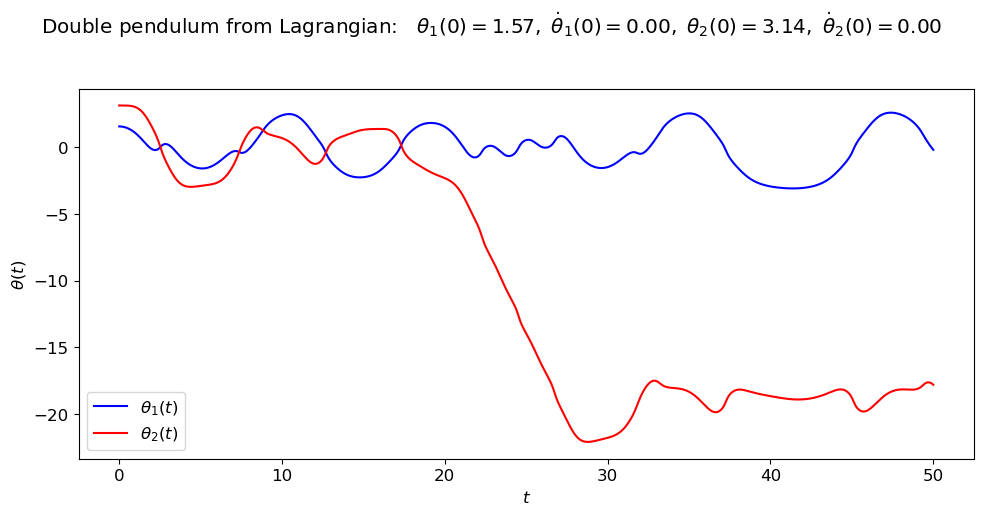

In [9]:
# Specifying initial conditions for plot
theta1_0 = np.pi/2
theta1_dot_0 = 0.
theta2_0 = np.pi
theta2_dot_0 = 0
theta1, theta1_dot, theta2, theta2_dot = dp1.solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0)


# start the plot!
fig = plt.figure(figsize=(10,5))
overall_title = 'Double pendulum from Lagrangian:  ' + \
                rf' $\theta_1(0) = {theta1_0:.2f},$' + \
                rf' $\dot\theta_1(0) = {theta1_dot_0:.2f},$' + \
                rf' $\theta_2(0) = {theta2_0:.2f},$' + \
                rf' $\dot\theta_2(0) = {theta2_dot_0:.2f}$'
fig.suptitle(overall_title, va='baseline')

ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], theta1[start : stop], 
            axis_labels=theta_vs_time_labels, 
            color='blue',
            label= r'$\theta_1(t)$', 
            ax=ax_a) 
plot_y_vs_x(t_pts[start : stop], theta2[start : stop], 
            axis_labels=theta_vs_time_labels, 
            color='red',
            label= r'$\theta_2(t)$',
            ax=ax_a)


fig.tight_layout()
# fig.savefig('double_pendulum_Lagrange.png', bbox_inches='tight')  

### Examining sensitivity to initial conditions

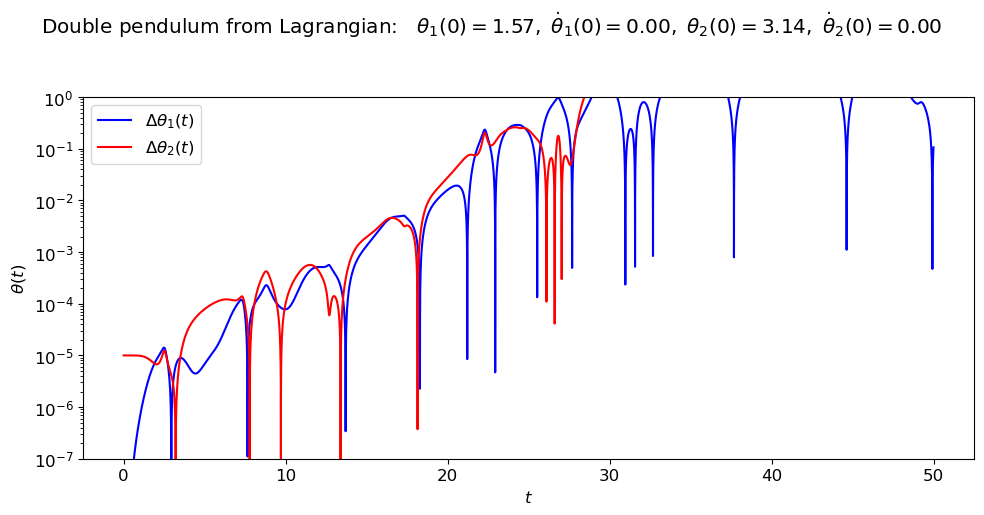

In [10]:
# Specifying initial conditions for plot
theta1_0 = np.pi/2
theta1_dot_0 = 0.
theta2_0 = np.pi
theta2_dot_0 = 0

theta1, theta1_dot, theta2, theta2_dot = \
        dp1.solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0)
theta1b, theta1_dotb, theta2b, theta2_dotb = \
        dp1.solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0-0.00001, theta2_dot_0)


# start the plot!
fig = plt.figure(figsize=(10,5))
overall_title = 'Double pendulum from Lagrangian:  ' + \
                rf' $\theta_1(0) = {theta1_0:.2f},$' + \
                rf' $\dot\theta_1(0) = {theta1_dot_0:.2f},$' + \
                rf' $\theta_2(0) = {theta2_0:.2f},$' + \
                rf' $\dot\theta_2(0) = {theta2_dot_0:.2f}$'
fig.suptitle(overall_title, va='baseline')

ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], np.abs(theta1[start : stop]-theta1b[start : stop]), 
            axis_labels=theta_vs_time_labels, 
            semilogy = True,
            color='blue',
            label= r'$\Delta\theta_1(t)$', 
            ax=ax_a) 
plot_y_vs_x(t_pts[start : stop], np.abs(theta2[start : stop]-theta2b[start : stop]), 
            axis_labels=theta_vs_time_labels, 
            semilogy=True,
            color='red',
            label= r'$\Delta\theta_2(t)$',
            ax=ax_a)
ax_a.set_ylim(1.e-7,1)

fig.tight_layout()
# fig.savefig('double_pendulum_initial_conditions.png', bbox_inches='tight')  

This shows that if we have two identical double pendulums which are given initial conditions differing very slightly (here, just for the second pendulum with mass $m_2$, the difference in their solutions increases exponentially with time, diverging into chaotic motion.

### Setting the masses and lengths to be different

Setting $m_2$ = 1/2 $m_1$ and $L_2$ = 2 $L_2$

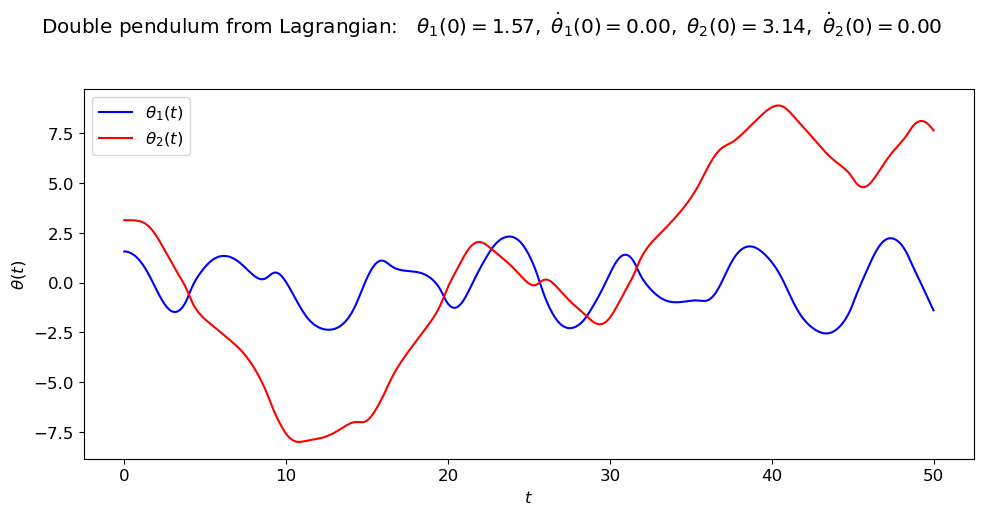

In [11]:
L1 = 1.
L2 = 2.
g = 1.
mass1 = 1.
mass2 = 1/2.

# Instantiate a pendulum 
dp1 = DoublePendulum(L1=L1, L2 = L2, mass1=mass1, mass2=mass2, g=g)

# Specifying initial conditions for plot
theta1_0 = np.pi/2
theta1_dot_0 = 0.
theta2_0 = np.pi
theta2_dot_0 = 0
theta1, theta1_dot, theta2, theta2_dot = dp1.solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0)


# start the plot!
fig = plt.figure(figsize=(10,5))
overall_title = 'Double pendulum from Lagrangian:  ' + \
                rf' $\theta_1(0) = {theta1_0:.2f},$' + \
                rf' $\dot\theta_1(0) = {theta1_dot_0:.2f},$' + \
                rf' $\theta_2(0) = {theta2_0:.2f},$' + \
                rf' $\dot\theta_2(0) = {theta2_dot_0:.2f}$'
fig.suptitle(overall_title, va='baseline')

ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], theta1[start : stop], 
            axis_labels=theta_vs_time_labels, 
            color='blue',
            label= r'$\theta_1(t)$', 
            ax=ax_a) 
plot_y_vs_x(t_pts[start : stop], theta2[start : stop], 
            axis_labels=theta_vs_time_labels, 
            color='red',
            label= r'$\theta_2(t)$',
            ax=ax_a)


fig.tight_layout()

In [13]:
from matplotlib import animation, rc
from IPython.display import HTML

In [14]:
def xy_coords(x0, y0, L, theta):
    x = x0 + L*np.sin(theta)
    y = y0 - L*np.cos(theta)
    return x, y
    

In [44]:
%%capture

L1 = 1.
L2 = 1.
g = 1.
mass1 = 1.
mass2 = 1.
dp1 = DoublePendulum(L1=L1, L2 = L2, mass1=mass1, mass2=mass2, g=g)

theta1_0 = np.pi
theta1_dot_0 = 0.
theta2_0 = np.pi/2
theta2_dot_0 = 0

# Setting ranges
t_start = 0.
t_end = 200.
delta_t = 0.05

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

x_min = -3
x_max = 3
y_min = -3
y_max = 3

theta1, theta1_dot, theta2, theta2_dot = dp1.solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0)
theta1b, theta1b_dot, theta2b, theta2b_dot = dp1.solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0-0.00001, theta2_dot_0)

fig_anim = plt.figure(figsize=(6,6), num='Double pendulum')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min, x_max)
ax_anim.set_ylim(y_min, y_max)

# By assigning the first return from plot to line_anim, we can later change
#  the values in the line.
x0, y0 = 0, 0
x1, y1 = xy_coords(x0, y0, dp1.L1, theta1[0])
x2, y2 = xy_coords(x0, y0, dp1.L2, theta2[0])
x1b, y1b = xy_coords(x0, y0, dp1.L1, theta1b[0])
x2b, y2b = xy_coords(x0, y0, dp1.L2, theta2b[0])

pt_anim0, = ax_anim.plot(x0, y0, marker = 'o', color='black')

pt_anim1, = ax_anim.plot(x1, y1, marker = 'o', markersize = 10, color='red')
line_anim1, = ax_anim.plot([x0,x1], [y0,y1], color='red', lw=2)

pt_anim2, = ax_anim.plot(x2, y2, marker = 'o', markersize = 10, color='red')
line_anim2, = ax_anim.plot([x1,x2], [y1,y2], color='red', lw=2)

pt_anim1b, = ax_anim.plot(x1b, y1b, marker = 'o', markersize = 10, color='blue')
line_anim1b, = ax_anim.plot([x0,x1b], [y0,y1b], color='blue', lw=2)

pt_anim2b, = ax_anim.plot(x2b, y2b, marker = 'o', markersize = 10, color='blue')
line_anim2b, = ax_anim.plot([x1b,x2b], [y1b,y2b], color='blue', lw=2)


fig_anim.tight_layout()

In [45]:
def animate_pendulum(i):
    """This is the function called by FuncAnimation to create each frame,
        numbered by i.  So each i corresponds to a point in the t_pts
        array, with index i.
    """
    i_skip = 2*i
    
    x0, y0 = 0, 0
    x1, y1 = xy_coords(x0, y0, dp1.L1, theta1[i_skip])
    x2, y2 = xy_coords(x0, y0, dp1.L2, theta2[i_skip])
    x1b, y1b = xy_coords(x0, y0, dp1.L1, theta1b[i_skip])
    x2b, y2b = xy_coords(x0, y0, dp1.L2, theta2b[i_skip])

    pt_anim0.set_data(x0, y0)
    pt_anim1.set_data(x1, y1)  # overwrite line_anim with new points
    pt_anim2.set_data(x2, y2)
    line_anim1.set_data([x0,x1], [y0,y1])
    line_anim2.set_data([x1,x2], [y1,y2])
    
    pt_anim1b.set_data(x1b, y1b)
    pt_anim2b.set_data(x2b, y2b)
    line_anim1b.set_data([x0,x1b], [y0,y1b])
    line_anim2b.set_data([x1b,x2b], [y1b,y2b])
    
    return (pt_anim0, pt_anim1, pt_anim2, line_anim1, line_anim2,
           pt_anim1b, pt_anim2b, line_anim1b, line_anim2b)   # this is needed for blit=True to work

In [46]:
frame_interval = 30.  # time between frames
frame_number = 1000   # number of frames to include (index of t_pts)
anim = animation.FuncAnimation(fig_anim, 
                               animate_pendulum, 
                               init_func=None,
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True,
                               repeat=False)

In [47]:
HTML(anim.to_jshtml())